<h1>Solving the Transmission Problem using the Period Trapezoid Rule</h1>

<h2>Introduction</h2>


Our goal is to simulate optical cloaking devices by calculating how light travels through defined boundaries.  Optical cloaking refers to the act of making something invisible in some directions by preventing the scattering of light as it hits the boundary.  We use boundary integral equation methods to compute the solution in layered boundaries.

In this notebook, we implement in Python an approximation through the use of two main functions: 
<ul>
    <li><u><i>find_boundary_data</i></u> - Implements the Kress Quadrature in order to find the values needed to solve the boundary integral equation system discussed in the next section.</li>
    <li><u><i>make_solution_grid</i></u> - Implements the Periodic Trapezoid Rule (PTR) to approximate the solution inside and outside the boundary in a body-fitted grid.</li>
</ul>

<h3>Numerical Method</h3>
Our method is derived from an integral equation system discussed in Kress's <i>Boundary Integral Equations</i> paper [1].  This system is one method of finding a solution to the Hemholtz equation.  These equations are rewritten using the same notation used in this notebook.

$\Delta u + k^2 u = 0 \hspace{70mm}$ (Hemholtz Wave Equation)

$u(x) = \int_{B}\frac{\partial \Phi (x,y)}{\partial \nu (y)}\mu(y) - ik\int_{B} \Phi (x,y) \mu (y) dy \hspace{22mm} $(Kress's Boundary Integral Equation)

$\Phi$ represents the fundamental solution to the Hemholtz Wave Equation: 
$\Phi (x,y) = \frac{i}{4} H_{0}^{(1)}(k\left|x - y\right |)$.<br><br>

<img src="boundary_notes_updated.JPG" alt="Drawing" style="width: 300px;" align="left"/>

For transmission, we need to extend this method to include the exterior and the interior of the boundary together.  Instead of a single boundary integral equation, we use two to define the solution inside and outside.

$u_e(x) = f(x) + \int_{B}\frac{\partial \Phi ^{e}}{\partial \nu(y)}(x,y) u_e(y) - \int_{B}\Phi ^{e}(x,y)\frac{\partial u_e (y)}{\partial \nu (y)} d\sigma _y \quad x$ $\epsilon$ $E$

$u_i(x) = -\int_{B}\frac{\partial \Phi ^{i}}{\partial \nu (y)}(x,y)u_i(y) + \int_{B}\Phi ^{i} (x,y) \frac{\partial u_i(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $I$

B refers to the domain of the boundary.  E and I are the domains outside and inside of the boundary, respectively.
Using the transmission conditions, $u_i = u_e$ and $\frac{1}{k_i} \frac{\partial u_i}{\partial \nu} = \frac{1}{k_e} \frac{\partial u_e}{\partial \nu}$, this system of equations can be rewritten in terms of $u_i$ and $\frac{\partial u_i}{\partial \nu}$.

$u_e(x) = f(x) + \int_{B}\frac{\partial \Phi ^{e}}{\partial \nu(y)}(x,y) u_i(y) - \frac{k_e}{k_i}\int_{B}\Phi ^{e}(x,y)\frac{\partial u_i (y)}{\partial \nu (y)} d\sigma _y \quad x$ $\epsilon$ $E$

$u_i(x) = -\int_{B}\frac{\partial \Phi ^{i}}{\partial \nu (y)}(x,y)u_i(y) + \int_{B}\Phi ^{i} (x,y) \frac{\partial u_i(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $I$

These equations can be rewritten and turned into a matrix equation.  By solving this matrix system for $u_i$ and $\frac{\partial u_i}{\partial \nu}$ on the boundary, those values can be used to approximate via the PTR inside and outside the boundary.

$$\begin{bmatrix} \frac{I}{2} - D^{e} & \frac{k_e}{k_i}S^{e} \\ \frac{I}{2} + D^{i} & -S^{i} \end{bmatrix} \begin{bmatrix}u_i \\ \frac{\partial u_i}{\partial \nu}\end{bmatrix} = \begin{bmatrix} f \\ 0 \end{bmatrix}$$

<h3>Variable Definitions</h3>

<b> Of the Boundary</b><br>
M = Number of points on the boundary<br>
J = Jacobian<br>
τ = Tangent Vector<br>
ν = Normal Vector<br>
κ = Curvature

<b> Of the PTR Approximation</b><br>
f = Source / Incidence field<br>
k = Wave Number<br>
x, y = Domain and range of the boundary<br>
v = Plot of the area captured by the function

<h2>Implementation</h2>

In [23]:
%matplotlib inline
import sympy as sp
import numpy as np
from sympy import cos, sin, exp
from numpy import sqrt, log
from scipy.special import hankel1
from scipy.special import jv as besselj
from scipy.linalg import toeplitz
from matplotlib import pyplot as plt
from numpy import vectorize
from mpl_toolkits.mplot3d import Axes3D

# For testing animated plots
from plotly.offline import plot, iplot, init_notebook_mode
from plotly.graph_objs import *
init_notebook_mode()
init_notebook_mode(connected=True)
from IPython.display import HTML

<h3>Boundary class definition</h3>

In [24]:
class Boundary:
    '''
    Defines the class Boundary, that contains geometric features of a boundary
    
    Attributes
    ==========
    param: parametrization of a boundary
    veloc: derivative of the parametrization
    accel: second derivative of the parametrization
    normal: normal vector to the boundary
    tangent: tangent vectors to the boundary
    curvature: signed curvature of the boundary
    jacobian: Jacobian of the boundary
    '''
    
    def __init__(self, b):
        self.y = b
    
    @property
    def yp(self):
        return [sp.diff(p, t) for p in self.y]
    @property
    def ypp(self):
        return [sp.diff(p, t) for p in self.yp]
    @property
    def J(self):
        v2 = [i**2 for i in self.yp]
        sv2 = sum(v2)
        return sp.sqrt(sv2).simplify()
    @property
    def τ(self):
        return [p/self.J for p in self.yp]
    @property
    def ν(self):
        if len(self.y) == 2:
            tmp = (self.yp[1]/self.J, -self.yp[0]/self.J )
            return tmp
        else:
            raise ValueError('Need to define the normal vector for higher dimensions')
    @property
    def κ(self): #curvature kappa
        if len(self.y) == 2:
            tmp = (self.yp[0]*self.ypp[1] - self.yp[1]*self.ypp[0])/self.J**3  
            return tmp.simplify()
        else:
            raise ValueError('Need to define the mean curvature for higher dimensions')

<h3>Calculation of $u$ and $\frac{\partial u}{\partial \nu}$ on the boundary (using Kress quadrature)</h3>

In [25]:
def find_boundary_data(f, xbdy, ybdy, ν, J, κ):
    '''
    Computes u and du/dv on the boundary by solving the BIE system
    
    Attributes
    ======
    kernel of the double layer, L
    kernel of the single layer, M
    solution on the boundary, u
    normal derivative on the boundary, dvu
    '''
    
    E_C = 0.5772156649015328606065120900824;  # Euler's constant
    N = M / 2;
    m = np.arange(1, N);

    # Create array for ifft...
    a = [0]
    a.extend(1/m)
    a.append(1/N)
    a.extend((1/m)[::-1])

    Rj = -2 * np.pi * np.fft.ifft(a);
    R = np.real(toeplitz(Rj, Rj)); #check coefficients Matlab Toeplitz, order correct ?

    # Prepare arrays for solving integral equation of the boundary (Kress pt. 2)
    L_e = np.zeros((M, M), dtype=complex);
    M_e = np.zeros((M, M), dtype=complex);
    L_i = np.zeros((M, M), dtype=complex);
    M_i = np.zeros((M, M), dtype=complex);
    
    L1_e = np.zeros((M, M), dtype=complex);
    L2_e = np.zeros((M, M), dtype=complex);
    M1_e = np.zeros((M, M), dtype=complex);
    M2_e = np.zeros((M, M), dtype=complex);
    
    L1_i = np.zeros((M, M), dtype=complex);
    L2_i = np.zeros((M, M), dtype=complex);
    M1_i = np.zeros((M, M), dtype=complex);
    M2_i = np.zeros((M, M), dtype=complex);

    A = np.zeros((2*M, 2*M), dtype=complex);
    F = np.zeros(2*M, dtype=complex);
    for m in range(0, M):
        for n in range(0, M):
            rdiff = np.asarray([xbdy[m] - xbdy[n], ybdy[m] - ybdy[n]]);
            distance = sqrt(np.power(rdiff[:][0], 2) + np.power(rdiff[:][1], 2));
            M1_e[m][n] = -0.5 / np.pi * J[n] * besselj(0, k_e * distance);
            M1_i[m][n] = -0.5 / np.pi * J[n] * besselj(0, k_i * distance);
            if m == n:
                #Implementration of the Kress Quadrature
                L1_e[m][n] = 0;
                L2_e[m][n] = 0.5 / np.pi * κ[n] * J[n];
                M2_e[m][n] = J[n] * ( 0.5 * 1j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_e, 2) * np.power(J[n], 2)));
                
                L1_i[m][n] = 0;
                L2_i[m][n] = 0.5 / np.pi * κ[n] * J[n];
                M2_i[m][n] = J[n] * ( 0.5 * 1j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_i, 2) * np.power(J[n], 2)));
            
            else:
                #Compute cosθ and logterm for kernel calculation
                a = np.asmatrix([ν[0][n], ν[1][n]]);
                b = np.asmatrix(rdiff/distance);
                cosθ = np.asscalar(np.matmul(a, b.transpose()));
                
                logterm = log(float(4 * np.power(sin(0.5 * (m - n) * dt), 2))); #why float ?
                
                #Compute kernels for the BIE system
                L1_e[m][n] = 0.5 * k_e / np.pi * J[n] * cosθ * besselj(1, k_e * distance);
                L2_e[m][n] = 0.5 * 1j * k_e * J[n] * cosθ * hankel1(1, k_e * distance) - L1_e[m][n] * logterm;
                M2_e[m][n] = 0.5 * 1j * J[n] * hankel1(0, k_e * distance) - M1_e[m][n] * logterm;
                
                L1_i[m][n] = 0.5 * k_i / np.pi * J[n] * cosθ * besselj(1, k_i * distance);
                L2_i[m][n] = 0.5 * 1j * k_i * J[n] * cosθ * hankel1(1, k_i * distance) - L1_i[m][n] * logterm;
                M2_i[m][n] = 0.5 * 1j * J[n] * hankel1(0, k_i * distance) - M1_i[m][n] * logterm;
    
            L_e[m][n] = 0.5 * R[m][n] * (L1_e[m][n]) + 0.5 * (np.pi / N) * (L2_e[m][n]);
            M_e[m][n] = (0.5 * R[m][n] * (M1_e[m][n]) + 0.5 * (np.pi / N) * (M2_e[m][n]));
            
            L_i[m][n] = 0.5 * R[m][n] * (L1_i[m][n]) + 0.5 * (np.pi / N) * (L2_i[m][n]);
            M_i[m][n] = 0.5 * R[m][n] * (M1_i[m][n]) + 0.5 * (np.pi / N) * (M2_i[m][n]);

    #Matrix of combined representation formulas       
    A11 = 0.5 * np.identity(M) - L_e;
    A12 = k_ratio * M_e;
    A21 = 0.5 * np.identity(M) + L_i;
    A22 = -M_i;

    #Combine A's into one matrix, A
    A[0:M, 0:M] = A11; A[0:M, M: 2*M] = A12;
    A[M: 2*M, 0:M] = A21; A[M: 2*M, M: 2*M] = A22;
    
    #Make matrix for f and 0's, call it F
    F[0:M] = f;
    
    #Solve for u and dvu from AU = F
    U = np.linalg.solve(A,F);
    u = U[0:M];
    dvu = U[M: 2*M];
    return u, dvu

<h3>Calculation of solution grid (using Periodic Trapezoid Rule)</h3>

In [26]:
def make_solution_grid(ngrid, f, u, dvu, xbdy, ybdy, ν, J, κ):
    '''
    Calculate the solution for interior and exterior domains using u and dvu
    
    Attributes
    ==========
    domain and range values for plot of the solution grid, x and y
    approximation of the solution using PTR, v
    exact solution for known case of ke = ki, exact
    
    '''
    # Find the absolute maximum curvature |κ|max
    κ_max = np.amax(np.abs(κ));

    dn = (1/κ_max)/ngrid;
    rgrid = np.arange(0+dn, 1/ κ_max, dn);

    # Allocate memory for the solution
    x_e  = np.zeros((M + 1, ngrid - 1));
    y_e  = np.zeros((M + 1, ngrid - 1));
    v_e  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    
    x_i  = np.zeros((M + 1, ngrid - 1));
    y_i  = np.zeros((M + 1, ngrid - 1));
    v_i  = np.zeros((M + 1, ngrid - 1), dtype=complex); # Kernel and sum will include complex numbers
    
    for m in range(0, M):
        for n in range(0, ngrid-1):
            x_e[m][n] = xbdy[m] + rgrid[n]*ν[0][m];
            y_e[m][n] = ybdy[m] + rgrid[n]*ν[1][m];

            xe_diff = x_e[m][n] - xbdy;
            ye_diff = y_e[m][n] - ybdy;
        
            distance_e = sqrt(np.power(xe_diff, 2) + np.power(ye_diff, 2)); #(r in kress)
            cosθ_e = (ν[0][:]*xe_diff + ν[1][:]*ye_diff ) / distance_e;
            
            kernelD_e = 0.25 * 1j * (k_e * cosθ_e * hankel1(1, k_e*distance_e));
            kernelS_e = 0.25 * 1j * hankel1(0, k_e*distance_e); # kress (2.2+)
            
            fx = np.exp(1j * k_e * (np.cos(alpha) * x_e[m][n] + np.sin(alpha) * y_e[m][n]));
            v_e[m][n] = fx + sum(kernelD_e * J * f)* dt - k_ratio * sum(kernelS_e * J * dvf) * dt; #From Representation Formula (1)
             
            # Do the same as above but for the interior...
            x_i[m][n] = xbdy[m] - rgrid[n]*ν[0][m];
            y_i[m][n] = ybdy[m] - rgrid[n]*ν[1][m];
            
            xi_diff = x_i[m][n] - xbdy;
            yi_diff = y_i[m][n] - ybdy;
            
            distance_i = sqrt(np.power(xi_diff, 2) + np.power(yi_diff, 2)); #(r in kress)
            cosθ_i = (ν[0][:]*xi_diff + ν[1][:]*yi_diff) / distance_i;
            
            kernelD_i = 0.25 * 1j * (k_i * cosθ_i * hankel1(1, k_i*distance_i));
            kernelS_i = 0.25 * 1j * hankel1(0, k_i*distance_i);
            v_i[m][n] = -sum(kernelD_i * J * u) * dt + sum(kernelS_i * J * dvu) * dt; #From Representation Formula (2)
    
    #Impose Periodicity
    x_e[M][:] = x_e[0][:];
    y_e[M][:] = y_e[0][:];
    v_e[M][:] = v_e[0][:];
    
    x_i[M][:] = x_i[0][:];
    y_i[M][:] = y_i[0][:];
    v_i[M][:] = v_i[0][:];
    
    #Combine results for plot displays
    #x = np.zeros((2 * (M + 1), ngrid - 1));
    #y  = np.zeros((2 * (M + 1), ngrid - 1));
    #v  = np.zeros((2 * (M + 1), ngrid - 1), dtype=complex);

    #x[0:M+1][:] = x_i; x[M+1:2 * (M+1)] = x_e;
    #y[0:M+1][:] = y_i; y[M+1:2 * (M+1)] = y_e;
    #v[0:M+1][:] = v_i; v[M+1:2 * (M+1)] = v_e;
    
    return x_i, x_e, y_i, y_e, v_i, v_e

In [27]:
def find_exact_solution(x_i, x_e, y_i, y_e):
    exact_i = np.exp(1j * k_i * (np.cos(alpha) * x_i + np.sin(alpha) * y_i));
    exact_e = np.exp(1j * k_i * (np.cos(alpha) * x_e + np.sin(alpha) * y_e));
    return exact_i, exact_e

<h2>Numerical results</h2>

In order to validate our method, we will firstly display the results for a case such that the solution is known.  This solution is such that:
$$f(x) = e^{i k_e (cos(\alpha)x + sin(\alpha)y)}$$
$$k_e = k_i$$<br>
The values of $\alpha$, $k_e$, and $k_i$ are chosen below when we set the paramaters for our calculations.  Our solution is given by the value $v$ and is compared to the known solution, which we call $exact$.  This error is displayed on a log plot which follows the surface plots of the approximate and exact solutions.<br><br>

Our method is then use to examine our results for different scenarios.  For example, we apply our method for the case when $k_i = -0.5 k_e$.  We also test our method for different shapes of the boundary, such as a star-shaped boundary.

<h3>Defined Boundary Curves</h3>

In [28]:
# Specify the shape of the boundaries
t = sp.Symbol('t');

Ellipse = (2*cos(t), 3*sin(t));
Circle = (cos(t), sin(t));
Star = ((1+0.3*cos(5*t))*cos(t), (1+0.3*cos(5*t))*sin(t));
Kite = ((cos(t) + 0.65*cos(2*t) -0.65, 1.5*sin(t)));

E = Boundary(Ellipse);
K = Boundary(Kite);
C = Boundary(Circle);
S = Boundary(Star);

# Convert the sympy into numpy quantities
bdy_E = sp.lambdify(t, E.y);
ν_E = sp.lambdify(t, E.ν);
J_E = sp.lambdify(t, E.J);
κ_E = sp.lambdify(t, E.κ);

bdy_K = sp.lambdify(t, K.y);
ν_K = sp.lambdify(t, K.ν);
J_K = sp.lambdify(t, K.J);
κ_K = sp.lambdify(t, K.κ);

bdy_C = sp.lambdify(t, C.y);
ν_C = sp.lambdify(t, C.ν);
J_C = sp.lambdify(t, C.J);
κ_C = sp.lambdify(t, C.κ);

bdy_S = sp.lambdify(t, S.y);
ν_S = sp.lambdify(t, S.ν);
J_S = sp.lambdify(t, S.J);
κ_S = sp.lambdify(t, S.κ);

<h3>Initial condition and parameters</h3>

In [29]:
# Evaluate boundary data
def def_f(bdy):
    xbdy = bdy[0][:];
    ybdy = bdy[1][:];
    
    # Plane Wave Equation
    f = np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy));
    return xbdy, ybdy, f

<h2>Display of the results</h2>

<h3>Ellipse boundary where $k_e = k_i = 3$</h3>
We use this as a validation of our method since the solution is known for $k_e = k_i$.  When they are equal, this is the same as saying the interior and the exterior are the same medium, so there no change in the source $f$ across the boundary.

In [30]:
# Evaluation of the results for given parameters
# USER INPUTS: Modify M, k_e, k_i, and ngrid to modify results
M = 500
k_e = 3
k_i = 3
k_ratio = k_e/k_i;
ngrid = 49;
alpha = np.pi / 5;
# Values for parameterization of the boundaryh
dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);

# Using bdy, ν, J, and κ function names for ellipse
xbdy, ybdy, f  = def_f(bdy_E(θ));
u, dvu = find_boundary_data(f, xbdy, ybdy, ν_E(θ), J_E(θ), κ_E(θ));

<h4>Validation of the boundary data</h4>

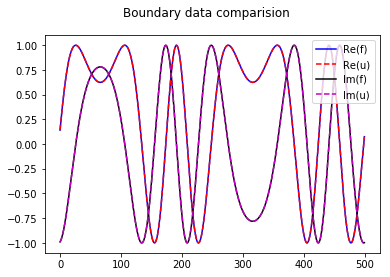

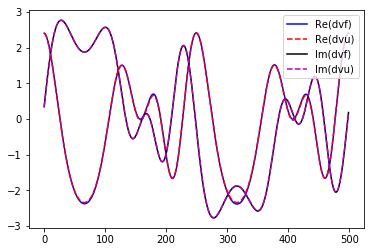

In [31]:
df = [1j * k_e * np.cos(alpha) * np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy)), 1j * k_e * np.sin(alpha) * np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy))]
dvf = ν_E(θ)[0] * df[0] + ν_E(θ)[1] * df[1]

fig, ax  = plt.subplots(1,1)
fig.suptitle('Boundary data comparision');
ax.plot(np.real(u), 'b', label='Re(f)')
ax.plot(np.real(f), 'r--', label='Re(u)')
ax.plot(np.imag(u), 'k', label='Im(f)')
ax.plot(np.imag(f), 'm--', label='Im(u)')
ax.legend(loc='upper right');
fig, ax  = plt.subplots(1,1)
ax.plot(np.real(dvu), 'b', label='Re(dvf)')
ax.plot(np.real(dvf), 'r--', label='Re(dvu)')
ax.plot(np.imag(dvu), 'k', label='Im(dvf)')
ax.plot(np.imag(dvf), 'm--', label='Im(dvu)')
ax.legend(loc='upper right');

As seen above, our calculation of $u_i$ (called u) and $\frac{\partial u_i}{\partial \nu}$ (called dvu) is accurate compared to the actual values of $f$ and $\frac{\partial f}{\partial \nu}$.  Therefore, we expect our final results to be accurate as well, so long as our method in _make-solution-grid_ is correct.

<h4>Compute the solution </h4>

In [32]:
x_i, x_e, y_i, y_e, v_i, v_e = make_solution_grid(ngrid, f, u, dvu, xbdy, ybdy, ν_E(θ), J_E(θ), κ_E(θ));
exact_i, exact_e = find_exact_solution(x_i, x_e, y_i, y_e)

In [ ]:
fig = plt.figure(figsize=(15,12))
fig.suptitle("Ellipse Boundary for k_e = k_i");
ax = fig.add_subplot(2 ,2 ,1, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_i, y_i, np.real(v_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_e, y_e, np.real(v_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Real Part of the PTR Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_i, y_i, np.imag(v_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_e, y_e, np.imag(v_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Imaginary Part of the PTR Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2 ,2 ,3, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_i, y_i, np.real(exact_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_e, y_e, np.real(exact_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Real Part of the Exact Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_i, y_i, np.imag(exact_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_e, y_e, np.imag(exact_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), linewidth=0, antialiased=False)
plt.title("Imaginary Part of the Exact Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

As seen above, our results using the PTR appear identical to the exact solution, which is known for $k_e = k_i$.  However, because small disparities may exist that cannot be seen by examination, we will also use a log plot of the error to evaluate how accurate our method is.

<h3>Error Plot for $k_e = k_i$ </h3>

In [ ]:
data= [Surface(x=x_i, y=y_i, z=log(np.absolute(v_i - exact_i))), Surface(x=x_e, y=y_e, z=log(np.absolute(v_e - exact_e)))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=600,
            height=600,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Error Plot', hovermode='closest'
           )
          
figure1=dict(data=data, layout=layout)          
iplot(figure1)

Although our previous surface plots appeared identical, an examination of the error reveals signifcant error as we approach our boundary.  There is also odd behavior on the interior of the boundary, whereas the error is low everywhere outside the boundary as we get further from it.  We do expect to see this for our current method, because the fundamental solution $\Phi$ becomes nearly singular for $x - y$ close to 0. In the future, we hope to reduce the error near and inside the boundary.

Despite this error, we consider this a validation of our method.  Therefore, we can use it to examine how a source changes when it travels through different mediums.  This is done by making $k_e$ and $k_i$ equal to different values.  Two examples are shown below.

<h3>Ellipse boundary where $k_e = 0.5k_i = 2$</h3>

In [ ]:
M = 300
k_e = 2
k_i = 4
k_ratio = k_e/k_i;
ngrid = 49;
# Values for parameterization of the boundaryh
dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);

# Using bdy, ν, J, and κ function names for ellipse
xbdy2, ybdy2, f2  = def_f(bdy_E(θ));
u2, dvu2 = find_boundary_data(f2, xbdy2, ybdy2, ν_E(θ), J_E(θ), κ_E(θ));
x_i2, x_e2, y_i2, y_e2, v_i2, v_e2 = make_solution_grid(ngrid, f2, u2, dvu2, xbdy2, ybdy2, ν_E(θ), J_E(θ), κ_E(θ));

In [ ]:
data= [Surface(x=x_i2, y=y_i2, z=np.real(v_i2)), Surface(x=x_e2, y=y_e2, z=np.real(v_e2))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=500,
            height=500,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Real Part of the Solution', hovermode='closest'
           )
          
figure2=dict(data=data, layout=layout)          
iplot(figure2)

data= [Surface(x=x_i2, y=y_i2, z=np.imag(v_i2)), Surface(x=x_e2, y=y_e2, z=np.imag(v_e2))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=500,
            height=500,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Imaginary Part of the Solution', hovermode='closest'
           )
          
figure3=dict(data=data, layout=layout)          
iplot(figure3)

<h3>Ellipse Boundary where $k_e = -0.5k_i = 2$</h3>

In [ ]:
M = 300
k_e = 2
k_i = -4
k_ratio = k_e/k_i;
ngrid = 49;
# Values for parameterization of the boundaryh
dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);

# Using bdy, ν, J, and κ function names for ellipse
xbdy3, ybdy3, f3  = def_f(bdy_E(θ));
u3, dvu3 = find_boundary_data(f3, xbdy3, ybdy3, ν_E(θ), J_E(θ), κ_E(θ));
x_i3, x_e3, y_i3, y_e3, v_i3, v_e3 = make_solution_grid(ngrid, f3, u3, dvu3, xbdy3, ybdy3, ν_E(θ), J_E(θ), κ_E(θ));

In [ ]:
data= [Surface(x=x_i3, y=y_i3, z=np.real(v_i3)), Surface(x=x_e3, y=y_e3, z=np.real(v_e3))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=500,
            height=500,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Real Part of the Solution', hovermode='closest'
           )
          
figure2=dict(data=data, layout=layout)          
iplot(figure2)

data= [Surface(x=x_i3, y=y_i3, z=np.imag(v_i3)), Surface(x=x_e3, y=y_e3, z=np.imag(v_e3))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=500,
            height=500,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Imaginary Part of the Solution', hovermode='closest'
           )
          
figure3=dict(data=data, layout=layout)          
iplot(figure3)

As seen in both examples above, the source appears continuous across the boundary.  We expect this given the conditions for transmission which we imposed upon our method.  Different behaviors appear for different values for $k_e$ and $k_i$.  In the future, we hope to examine similar surface plots for different boundary shapes.  Our current method is not as accurate for other shapes as it is for ellipses and circles, as shown below.

<h3>Kite Boundary</h3>

In [ ]:
M = 300
k_e = 2
k_i = 2
k_ratio = k_e/k_i;
ngrid = 49;
# Values for parameterization of the boundaryh
dt = 2.0 * np.pi/(M);
θ = np.arange(0, 2* np.pi, dt);
# Using bdy, ν, J, and κ function names for ellipse
xbdy4, ybdy4, f4  = def_f(bdy_K(θ));
u4, dvu4 = find_boundary_data(f4, xbdy4, ybdy4, ν_K(θ), J_K(θ), κ_K(θ));
x_i4, x_e4, y_i4, y_e4, v_i4, v_e4 = make_solution_grid(ngrid, f4, u4, dvu4, xbdy4, ybdy4, ν_K(θ), J_K(θ), κ_K(θ));
exact_i4, exact_e4 = find_exact_solution(x_i4, x_e4, y_i4, y_e4);

In [ ]:
fig = plt.figure(figsize=(15,12))
fig.suptitle("Ellipse Boundary for k_e = k_i");
ax = fig.add_subplot(2 ,2 ,1, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_i4, y_i4, np.real(v_i4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_e4, y_e4, np.real(v_e4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
plt.title("Real Part of the PTR Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_i4, y_i4, np.imag(v_i4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_e4, y_e4, np.imag(v_e4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
plt.title("Imaginary Part of the PTR Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2 ,2 ,3, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_i4, y_i4, np.real(exact_i4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_e4, y_e4, np.real(exact_e4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
plt.title("Real Part of the Exact Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_i4, y_i4, np.imag(exact_i4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_e4, y_e4, np.imag(exact_e4), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = 1, vmax = 1, linewidth=0, antialiased=False)
plt.title("Imaginary Part of the Exact Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

Although we can faintly see the plane wave propogating over the kite-shaped boundary, the magnitude is not fairly accurate. Because this issue only arises when we attempt to use different boundaries, we believe the issue lies either somewhere in the boundary class or in the attributes of the boundary.

In [19]:
data= [Surface(x=x_i4, y=y_i4, z=log(np.absolute(v_i4 - exact_i4))), Surface(x=x_e4, y=y_e4, z=log(np.absolute(v_e4 - exact_e4)))]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=600,
            height=600,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Log Error Plot', hovermode='closest'
           )
          
figure1=dict(data=data, layout=layout)          
iplot(figure1)

<h2>Issues (Resolved and Unresolved)</h2>
<ul>
        <li>Exterior and Interior results have extreme error in comparison to exterior results.  Exterior seems to be off by some factor, and interior has weird behavior.  Compare to seperate notebooks for Interior and Exterior Representation - <b>RESOLVED</b> by removing signs from L and M formulas.</li> 
        <li>Results for different values of $k_e$ and $k_i$ do not seem to match up at the boundary.  Need to check calculation of $u$ and $dvu$. - <b>RESOLVED</b> by checking representation formula, adapting it for using interior data.
    <li>Strange rendering error in plots at (pi,0) for all results.  -<b>RESOLVED</b>, result arises due to imposition of periodicity.  Only appears when interior and exterior are combined in one array, but not when they're separate.</li>
    <li>Surface plots are unaligned due to plotly giving them separate color scales.  How to give plots the same scale? - <b>UNRESOLVED</b></li>
    <li>Results for different boundaries seem to be off by some multiple.  Problem does not seem to lie in boundary class definition - <b>RESOLVED</b> by imposing same color scales on plots</li>
</ul>

<h2>References</h2>
<ol>
    <li>R. Kress, Boundary Integral Equations in Time-Harmonic Acoustic Scattering. Math Comput. Model (1991).</li>
    <li>C. Carvalho, S. Khatri, and A.D. Kim, Asymptotic analysis for close evaluation of layer potentials, submitted. J. Comp. Phys. (2018).</li>
</ol>